In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.utils import shuffle

pd.plotting.register_matplotlib_converters()
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.2f}'.format
sns.set()

# Read Raw Data

In [0]:
raw_data = pd.read_csv('.../rating_data_ltm_combined.csv', index_col=0)

In [0]:
raw_data = shuffle(raw_data, random_state = 23)

In [0]:
print(raw_data.shape)
raw_data.head(3)

(130958, 28)


,Company Code,Country of Headquarters,TRBC Economic Sector Name,TRBC Business Sector Name,TRBC Industry Name,TRBC Industry Group Name,Company Name,Period End Date,Total Revenue,Normalized EBITDA,Normalized EBIT,Net Income Before Extraordinary Items,"Total Assets, Reported",Total Current Assets,Cash and Short Term Investments,"Accounts Receivable - Trade, Net",Notes Receivable - Short Term,Receivables - Other,Total Inventory,Total Liabilities,Total Current Liabilities,Accounts Payable,Total Debt,Total Equity,Provision for Income Taxes,"Interest Income (Expense), Net-Non-Operating, Total",Gross Profit,Issuer Rating
11092,BMHL.MZ,NaN,NaN,NaN,NaN,NaN,NaN,Unable to collect data for some field(s).,NaN,NaN,NaN,NaN,302188073.630037,20710169.5312958,NaN,NaN,NaN,NaN,NaN,174424780.593242,44343563.1949244,NaN,54193041.9779688,127763293.036795,NaN,NaN,NaN,NaN
14172,600720.SS,China,Basic Materials,Mineral Resources,Construction Materials,Construction Materials,Gansu Qilianshan Cement Group Co Ltd,Unable to collect data for some field(s).,924397848.683556,NaN,181047845.633649,136559048.458645,1444102826.65971,310424205.557831,86224281.4223676,63823333.8296782,64688862.7228907,5389769.67092545,72300485.7990865,591636057.009779,450416713.722064,179690308.956899,202949746.842006,852466770.013936,31014081.4228732,NaN,307531169.106161,NaN
6712,VILY.BO,NaN,NaN,NaN,NaN,NaN,NaN,Unable to collect data for some field(s).,3330284.11720398,209740.637114541,79912.137735487,59264.9613078828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21089.4577051916,-53373.8505524213,1097311.29761665,NaN


# Missing Values in Raw Data

In [0]:
#Error messages starting with 'Unable to collect data' are changed to NaN.
raw_data = raw_data.applymap(lambda x : np.nan if 'Unable to collect data' in str(x) else x)

In [0]:
#Missing values in the raw data
print('Len of Dataframe:', len(raw_data))
print('Number of unique company codes:', raw_data['Company Code'].nunique())
raw_data.isna().sum()

Len of Dataframe: 130958
Number of unique company codes: 45123


Company Code                                                0
Country of Headquarters                                 86252
TRBC Economic Sector Name                               86293
TRBC Business Sector Name                               86293
TRBC Industry Name                                      86293
TRBC Industry Group Name                                86293
Company Name                                            86662
Period End Date                                        130958
Total Revenue                                           24244
Normalized EBITDA                                       50315
Normalized EBIT                                         27488
Net Income Before Extraordinary Items                   20430
Total Assets, Reported                                  26840
Total Current Assets                                    36233
Cash and Short Term Investments                         33966
Accounts Receivable - Trade, Net                        43635
Notes Re

In [0]:
for column in raw_data.columns[8:-1]:
  raw_data[column] = raw_data[column].astype(float)

In [0]:
raw_data = raw_data[['Company Code', 'Country of Headquarters', 'TRBC Economic Sector Name',
                      'TRBC Business Sector Name', 'TRBC Industry Name',
                      'TRBC Industry Group Name', 'Company Name', 'Period End Date',
                      'Total Revenue', 'Gross Profit', 'Normalized EBITDA', 'Normalized EBIT',
                      'Net Income Before Extraordinary Items',
                      'Interest Income (Expense), Net-Non-Operating, Total',
                      'Total Assets, Reported',
                      'Total Current Assets', 'Cash and Short Term Investments',
                      'Accounts Receivable - Trade, Net', 'Notes Receivable - Short Term',
                      'Receivables - Other', 'Total Inventory', 'Total Liabilities',
                      'Total Current Liabilities', 'Accounts Payable', 'Total Debt',
                      'Total Equity',
                      'Issuer Rating']]

In [0]:
raw_data2 = raw_data.copy()

# Extracting unused companies from dataset

### Company Information Dataframe

HQ, Industry and Company Name

In [0]:
company_info = raw_data2[['Company Code', 'Country of Headquarters', 'TRBC Economic Sector Name' , 'TRBC Business Sector Name', 'TRBC Industry Name', 'TRBC Industry Group Name', 'Company Name']].dropna()

In [0]:
#Checking whether company codes are unique as expected.
print(company_info['Company Code'].nunique())
company_info.shape[0]

44252


44252

### Extracting Unused Industries

In [0]:
print('Number of Unique TRBC Industry Group Name', company_info['TRBC Industry Group Name'].nunique())
print('Number of Unique TRBC Industry Name', company_info['TRBC Industry Name'].nunique())

Number of Unique TRBC Industry Group Name 54
Number of Unique TRBC Industry Name 135


In [0]:
#Banks, Financial Institutions, Investment Trusts, Real Estate Companies and Holdings are not in the scope of this analysis.
#Following industries are extracted from dataset.
unused_industry_list = ['Banking Services', 'Investment Banking & Investment Services', 'Investment Holding Companies', 'Industrial Conglomerates', 'Collective Investments',
                        'Real Estate Operations', 'Residential & Commercial REITs', 'Insurance', 'Uranium']

In [0]:
#Extracting Unused Industries
company_info = company_info[company_info['TRBC Industry Group Name'].isin(unused_industry_list) == False]
print(company_info['Company Code'].nunique())

36150


### Filling Company Info Columns in Raw Data

In [0]:
raw_data2 = raw_data2[['Company Code']+raw_data2.columns[7:].to_list()]

In [0]:
raw_data2 = raw_data2.merge(company_info, on='Company Code', how='inner')

### Extracting Muslim Countries (except Turkey)

Due to large number of companies that finance their operations according to islamic rules (without interest)

In [0]:
muslim_country_list = [
                       'Malaysia','Jersey','Bahrain','Burkina Faso','Iraq','Jordan','Kuwait', 'Lebanon',
                       'Morocco', 'Oman', 'Nigeria', 'Palestine', 'Qatar', 'Saudi Arabia', 'Sudan', 'Syria', 'Tunisia',
                       'United Arab Emirates', 'Pakistan', 'Egypt'
]

raw_data2 = raw_data2[raw_data2['Country of Headquarters'].isin(muslim_country_list) == False]

### Extracting Companies without enough records

In [0]:
#Total number of companies of company occurance numbers.
raw_data2['Company Code'].value_counts().value_counts()

4    22418
1    12066
2      182
3      166
6        6
5        4
Name: Company Code, dtype: int64

In [0]:
#Check whether companies with one record have financial data or all columns are missing as expected.
onetime_company_list = pd.DataFrame(raw_data2['Company Code'].value_counts()[raw_data2['Company Code'].value_counts() == 1]).index.to_list()

print(raw_data2[raw_data2['Company Code'].isin(onetime_company_list)].shape)
raw_data2[raw_data2['Company Code'].isin(onetime_company_list)].isna().sum()

(12066, 27)


Company Code                                               0
Period End Date                                        12066
Total Revenue                                          11849
Gross Profit                                           12037
Normalized EBITDA                                      12038
Normalized EBIT                                        11857
Net Income Before Extraordinary Items                  11857
Interest Income (Expense), Net-Non-Operating, Total    11874
Total Assets, Reported                                 11864
Total Current Assets                                   11866
Cash and Short Term Investments                        11865
Accounts Receivable - Trade, Net                       11916
Notes Receivable - Short Term                          12043
Receivables - Other                                    11974
Total Inventory                                        11945
Total Liabilities                                      11866
Total Current Liabilitie

In [0]:
#Extracting Companies with different record numbers than 4.
unused_company_list = pd.DataFrame(raw_data2['Company Code'].value_counts()[raw_data2['Company Code'].value_counts() != 4]).index.to_list()
raw_data2 = raw_data2[raw_data2['Company Code'].isin(unused_company_list) == False]

# Deleting rows without balance sheet or income statement

In [0]:
#Deleting rows with missing balance sheet statement
raw_data2['nan_count'] = raw_data2.iloc[:,8:20].isna().sum(axis=1)
raw_data2['nan_count'].value_counts()

2     24191
1     21943
0     17414
3      8970
12     8140
4      6607
5      1429
11      404
6       311
7       163
8        46
10       27
9        27
Name: nan_count, dtype: int64

In [0]:
raw_data2 = raw_data2[raw_data2['nan_count'] != 12]

In [0]:
#Deleting rows with missing income statement
raw_data2['nan_count'] = raw_data2.iloc[:,2:8].isna().sum(axis=1)
raw_data2['nan_count'].value_counts()

0    52831
2    15599
1     9086
6     1522
3     1382
4      985
5      127
Name: nan_count, dtype: int64

In [0]:
raw_data2 = raw_data2[raw_data2['nan_count'] != 6]

In [0]:
raw_data2.drop('nan_count', axis=1, inplace=True)
raw_data2.shape

(80010, 27)

# Extracting companies with no information in last 3 years

### Reading Quarterly Data

In [0]:
quarter_data = pd.read_csv('/gdrive/My Drive/Rating/rating_data_combined.csv', index_col=0)

### Deleting unused columns in quarterly data

Deleting rows with missing company code, unused industry, missing balance sheet & income statement information, companies without enough records.

In [0]:
#Error messages starting with 'Unable to collect data' are changed to NaN.
quarter_data = quarter_data.applymap(lambda x : np.nan if 'Unable to collect data' in str(x) else x)

quarter_data = quarter_data[quarter_data['Company Code'].isna() == False]

#Deleting unused industries
company_info = quarter_data[['Company Code', 'Country of Headquarters', 'TRBC Industry Name', 'TRBC Industry Group Name', 'Company Name']].dropna()
unused_industry_list = ['Banking Services', 'Investment Banking & Investment Services', 'Investment Holding Companies', 'Industrial Conglomerates', 'Collective Investments',
                        'Real Estate Operations', 'Residential & Commercial REITs', 'Insurance']
quarter_data = quarter_data[['Company Code']+quarter_data.columns[5:].to_list()]
quarter_data = quarter_data.merge(company_info, on='Company Code', how='inner')

#Extracting Companies without enough records
unused_company_list = pd.DataFrame(quarter_data['Company Code'].value_counts()[quarter_data['Company Code'].value_counts() == 4]).index.to_list()
quarter_data = quarter_data[quarter_data['Company Code'].isin(unused_company_list) == False]

#Deleting rows without balance sheet or income statement
quarter_data['nan_count'] = quarter_data.iloc[:,6:18].isna().sum(axis=1)
quarter_data['nan_count'].value_counts()
quarter_data = quarter_data[quarter_data['nan_count'] != 12]

quarter_data['nan_count'] = quarter_data.iloc[:,2:6].isna().sum(axis=1)
quarter_data['nan_count'].value_counts()
quarter_data = quarter_data[quarter_data['nan_count'] != 12]


In [0]:
quarter_data['Period End Date'] = pd.to_datetime(quarter_data['Period End Date'])

In [0]:
#List of companies with at least one missing period end date.
period_na_company_list = quarter_data[quarter_data['Period End Date'].isna()]['Company Code'].unique()

#List of companies with at least one period end date info.
period_non_na_company_list = quarter_data[quarter_data['Period End Date'].isna() == False]['Company Code'].unique()

In [0]:
#List of companies with only NaN Period End Date
full_na_company_list = []
for code in period_na_company_list:
  if code not in period_non_na_company_list:
    full_na_company_list.append(code)
print('Number of companies without any period information:', len(full_na_company_list))

quarter_data = quarter_data[quarter_data['Company Code'].isin(full_na_company_list) == False]

Number of companies without any period information: 2686


In [0]:
#List of companies without Period End Date sooner than 2017
quarter_data['date_check'] = [1 if date > pd.to_datetime('01-01-2017') else 0 for date in quarter_data['Period End Date']]
date_check_df = pd.DataFrame(quarter_data.groupby('Company Code')['date_check'].sum())

company_date_check = []
for code in raw_data2['Company Code'].unique():
  if code in date_check_df[date_check_df['date_check'] == 0].index:
    company_date_check.append(code)

print('Number of companies without any period information sooner than 01-01-2017:', len(company_date_check))

Number of companies without any period information sooner than 01-01-2017: 680


### Extracting companies with no information in last 3 years

In [0]:
raw_data2 = raw_data2[raw_data2['Company Code'].isin(full_na_company_list+company_date_check) == False]

# Tax Rates

In [0]:
tax_rate = pd.read_excel('/gdrive/My Drive/Rating/tax rates.xlsx')

In [0]:
tax_rate = tax_rate[['LOCATION', 2019]]

In [0]:
tax_rate['LOCATION'] = tax_rate['LOCATION'].replace('United States', 'United States of America')\
                                           .replace('Hong Kong SAR', 'Hong Kong')\
                                           .replace('Palestinian Territory', 'Palestine')\
                                           .replace('Ireland', 'Ireland; Republic of')\
                                           .replace('Serbia', 'Republic of Serbia')\
                                           .replace('Montenegro', 'Republic of Montenegro')\
                                           .replace('Korea, Republic of', 'Korea; Republic (S. Korea)')

In [0]:
tax_rate.columns = ['location', 'tax_rate']

In [0]:
raw_data2 = raw_data2.merge(tax_rate, how='inner', left_on='Country of Headquarters', right_on='location').drop('location', axis=1)

# Final NaN Values in Columns

In [0]:
for column in raw_data2.columns:
  try:
    print('--------------------', column, '--------------------')
    print('NaN Rows:', len(raw_data2[raw_data2[column].isna()]))
    print('0:', len(raw_data2[raw_data2[column] == 0]))
    print('>1:', len(raw_data2[raw_data2[column] >= 1]))
    print('<1:', len(raw_data2[raw_data2[column] < 1]))
  except Exception:
    pass

-------------------- Company Code --------------------
NaN Rows: 0
0: 0
-------------------- Period End Date --------------------
NaN Rows: 75830
0: 0
>1: 0
<1: 0
-------------------- Total Revenue --------------------
NaN Rows: 53
0: 5271
>1: 70490
<1: 5287
-------------------- Gross Profit --------------------
NaN Rows: 10444
0: 176
>1: 63405
<1: 1981
-------------------- Normalized EBITDA --------------------
NaN Rows: 18517
0: 0
>1: 44544
<1: 12769
-------------------- Normalized EBIT --------------------
NaN Rows: 1297
0: 18
>1: 53172
<1: 21361
-------------------- Net Income Before Extraordinary Items --------------------
NaN Rows: 566
0: 10
>1: 50522
<1: 24742
-------------------- Interest Income (Expense), Net-Non-Operating, Total --------------------
NaN Rows: 16418
0: 190
>1: 21894
<1: 37518
-------------------- Total Assets, Reported --------------------
NaN Rows: 424
0: 55
>1: 75351
<1: 55
-------------------- Total Current Assets --------------------
NaN Rows: 802
0: 47
>1

In [0]:
for column in raw_data2.columns[2:20]:
  raw_data2[column+'_1'] = raw_data2[column].fillna(0)

In [0]:
final_data = raw_data2[(raw_data2['Total Revenue'] > 1) & (raw_data2['Total Revenue'].isna() == False) & \
                      (raw_data2['Gross Profit'] > 1) & (raw_data2['Gross Profit'].isna() == False) & \
                      (raw_data2['Total Assets, Reported'] > 1) & (raw_data2['Total Assets, Reported'].isna() == False) & \
                      (raw_data2['Total Liabilities'] > 1) & (raw_data2['Total Liabilities'].isna() == False) & \
                      (raw_data2['Total Current Assets'] > 1) & (raw_data2['Total Current Assets'].isna() == False) & \
                      (raw_data2['Total Current Liabilities'] > 1) & (raw_data2['Total Current Liabilities'].isna() == False) & \
                      (raw_data2['Net Income Before Extraordinary Items'] != 0) & (raw_data2['Net Income Before Extraordinary Items'].isna() == False) & \
                      (raw_data2['Total Equity'] > 1) & (raw_data2['Total Equity'].isna() == False) & \
                      (raw_data2['Cash and Short Term Investments_1'] >= 0) & \
                      (raw_data2['Accounts Receivable - Trade, Net_1'] >= 0) & \
                      (raw_data2['Notes Receivable - Short Term_1'] >= 0) & \
                      (raw_data2['Receivables - Other_1'] >= 0) & \
                      (raw_data2['Accounts Payable_1'] >= 0) & \
                      (raw_data2['Total Debt_1'] >= 0)
]

In [0]:
final_data = final_data[(final_data['Notes Receivable - Short Term_1'] == 0) | (final_data['Notes Receivable - Short Term_1'] > 1)]
final_data = final_data[(final_data['Total Debt_1'] == 0) | (final_data['Total Debt_1'] > 1)]

In [0]:
for column in final_data.columns[:-18]:
  try:
    print('--------------------', column, '--------------------')
    print('NaN Rows:', len(final_data[final_data[column].isna()]))
    print('0:', len(final_data[final_data[column] == 0]))
    print('>1:', len(final_data[final_data[column] >= 1]))
    print('<1:', len(final_data[final_data[column] < 1]))
  except Exception:
    pass

-------------------- Company Code --------------------
NaN Rows: 0
0: 0
-------------------- Period End Date --------------------
NaN Rows: 60335
0: 0
>1: 0
<1: 0
-------------------- Total Revenue --------------------
NaN Rows: 0
0: 0
>1: 60335
<1: 0
-------------------- Gross Profit --------------------
NaN Rows: 0
0: 0
>1: 60335
<1: 0
-------------------- Normalized EBITDA --------------------
NaN Rows: 13197
0: 0
>1: 41144
<1: 5994
-------------------- Normalized EBIT --------------------
NaN Rows: 0
0: 0
>1: 49691
<1: 10644
-------------------- Net Income Before Extraordinary Items --------------------
NaN Rows: 0
0: 0
>1: 46617
<1: 13718
-------------------- Interest Income (Expense), Net-Non-Operating, Total --------------------
NaN Rows: 13402
0: 62
>1: 17915
<1: 29018
-------------------- Total Assets, Reported --------------------
NaN Rows: 0
0: 0
>1: 60335
<1: 0
-------------------- Total Current Assets --------------------
NaN Rows: 0
0: 0
>1: 60335
<1: 0
------------------

In [0]:
final_data['net_debt_1'] = final_data['Total Debt_1'] - final_data['Cash and Short Term Investments_1']

In [0]:
final_data = final_data[((final_data['Normalized EBIT_1'] < 0) & (final_data['net_debt_1'] > 0))==False]

# Financial Ratio Features

In [0]:
#Current Ratio
final_data['current_ratio'] = final_data['Total Current Assets_1'] / final_data['Total Current Liabilities_1']

#Net Working Capital to Net Sales
final_data['nwc_to_sales'] = (final_data['Accounts Receivable - Trade, Net_1'] + final_data['Notes Receivable - Short Term_1'] + final_data['Total Inventory_1'] - final_data['Accounts Payable_1']) / final_data['Total Revenue_1']

#Cash Conversion Cycle
final_data['cash_conversion_cycle'] = ((365 * (final_data['Accounts Receivable - Trade, Net_1'] + final_data['Notes Receivable - Short Term_1'])) / final_data['Total Revenue_1']) +\
                                      ((365 * final_data['Total Inventory_1']) / (final_data['Total Revenue_1'] - final_data['Gross Profit_1'])) -\
                                      ((365 * final_data['Accounts Payable_1']) / (final_data['Total Revenue_1'] - final_data['Gross Profit_1']))

#Total Debt to Total Assets
final_data['debt_to_asset'] = final_data['Total Debt_1'] / final_data['Total Assets, Reported_1']

#Total Debt to Total Equity
final_data['debt_to_equity'] = final_data['Total Debt_1'] / final_data['Total Equity_1']

#1 / Interest Coverage Ratio
final_data['one_to_interest_coverage_ratio'] = final_data['Interest Income (Expense), Net-Non-Operating, Total_1'] / final_data['Normalized EBIT_1']

#Net Debt to EBIT
final_data['net_debt_to_ebit'] = (final_data['Total Debt_1'] - final_data['Cash and Short Term Investments_1']) / final_data['Normalized EBIT_1']

#Gross Profit Margin
final_data['gross_profit_margin'] = final_data['Gross Profit_1'] / final_data['Total Revenue_1']

#EBITDA Margin
final_data['ebitda_margin'] = final_data['Normalized EBITDA_1'] / final_data['Total Revenue_1']

#EBIT Margin
final_data['ebit_margin'] = final_data['Normalized EBIT_1'] / final_data['Total Revenue_1']

#Net profit Margin
final_data['net_profit_margin'] = final_data['Net Income Before Extraordinary Items_1'] / final_data['Total Revenue_1']

#Return on Invested Capital
final_data['roic'] = ((1 - (final_data['tax_rate']/100)) * final_data['Normalized EBIT_1']) / (final_data['Total Equity_1'] + final_data['Total Debt_1'])

#Return on Equity
final_data['roe'] = final_data['Net Income Before Extraordinary Items_1'] / final_data['Total Equity_1']

#Return on Asset
final_data['roa'] = final_data['Net Income Before Extraordinary Items_1'] / final_data['Total Assets, Reported_1']

#Asset Turnover Rate
final_data['asset_turnover_rate'] = final_data['Total Revenue_1'] / final_data['Total Assets, Reported_1']

In [0]:
final_data = final_data[final_data['cash_conversion_cycle'].isna() == False]

# Distribution and Outliers of Ratios

### Description of Ratios

In [0]:
ratio_data = final_data[[
                         'Company Code', 'Issuer Rating',
                         'Country of Headquarters',
                         'TRBC Industry Group Name', 'Company Name',
                         'current_ratio', 'nwc_to_sales',
                         'cash_conversion_cycle', 'debt_to_asset', 'debt_to_equity',
                         'net_debt_to_ebit', 'gross_profit_margin',
                         'ebitda_margin', 'ebit_margin', 'net_profit_margin', 'roic', 'roe',
                         'roa', 'asset_turnover_rate'
]]

In [0]:
print(ratio_data.shape)
ratio_data.iloc[:,-19:].describe()

(55194, 19)


,current_ratio,nwc_to_sales,cash_conversion_cycle,debt_to_asset,debt_to_equity,net_debt_to_ebit,gross_profit_margin,ebitda_margin,ebit_margin,net_profit_margin,roic,roe,roa,asset_turnover_rate
count,"55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00","55,194.00"
mean,2.64,0.28,56.60,0.19,1.28,4.69,0.35,-0.31,-0.40,-0.41,0.06,-0.04,0.02,0.95
std,9.01,5.58,"3,516.45",0.17,81.76,342.58,0.34,28.20,28.66,24.22,1.00,10.85,0.19,0.68
min,0.00,-288.91,"-429,215.20",0.00,0.00,"-68,774.95",0.00,"-6,251.59","-6,257.41","-4,998.35",-100.20,"-1,876.53",-7.42,0.00
25%,1.24,0.10,29.36,0.04,0.05,-1.49,0.18,0.00,0.03,0.01,0.03,0.03,0.01,0.52
50%,1.77,0.20,77.70,0.16,0.30,0.87,0.29,0.07,0.07,0.04,0.06,0.08,0.04,0.80
75%,2.79,0.33,141.02,0.30,0.74,4.13,0.46,0.15,0.13,0.10,0.10,0.14,0.07,1.19
max,"1,386.04","1,179.04","426,495.22",0.93,"17,492.88","23,547.40",41.71,160.92,160.79,922.76,149.12,245.54,8.26,10.96


### Extracting Strong Outliers

Due to anomalies in financial data such as Total Revenue, Assets, Normalized EBIT etc.

Anomalies stems from data source.

In [0]:
Q1 = ratio_data.quantile(0.25)
Q3 = ratio_data.quantile(0.75)
IQR = Q3 - Q1

ratio_data = ratio_data[~((ratio_data < (Q1 - 3 * IQR)) | (ratio_data > (Q3 + 3 * IQR))).any(axis=1)]

### Description after outliers

In [0]:
print(ratio_data.shape)
ratio_data.iloc[:,-19:].describe()

(41949, 19)


,current_ratio,nwc_to_sales,cash_conversion_cycle,debt_to_asset,debt_to_equity,net_debt_to_ebit,gross_profit_margin,ebitda_margin,ebit_margin,net_profit_margin,roic,roe,roa,asset_turnover_rate
count,"41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00","41,949.00"
mean,2.10,0.23,90.78,0.18,0.48,1.18,0.32,0.10,0.09,0.06,0.08,0.09,0.05,0.97
std,1.26,0.18,90.42,0.15,0.52,5.12,0.19,0.10,0.08,0.07,0.06,0.09,0.05,0.53
min,0.11,-0.52,-304.05,0.00,0.00,-18.33,0.00,-0.26,-0.28,-0.23,-0.20,-0.32,-0.17,0.01
25%,1.26,0.11,34.73,0.05,0.08,-1.61,0.18,0.00,0.04,0.02,0.04,0.04,0.02,0.60
50%,1.74,0.21,79.21,0.17,0.31,0.73,0.27,0.08,0.08,0.05,0.07,0.09,0.04,0.86
75%,2.57,0.32,135.57,0.29,0.70,3.56,0.42,0.15,0.13,0.09,0.11,0.14,0.07,1.23
max,7.44,1.02,475.24,0.72,2.82,20.96,1.16,0.60,0.44,0.34,0.33,0.48,0.25,3.22


### Correlogram

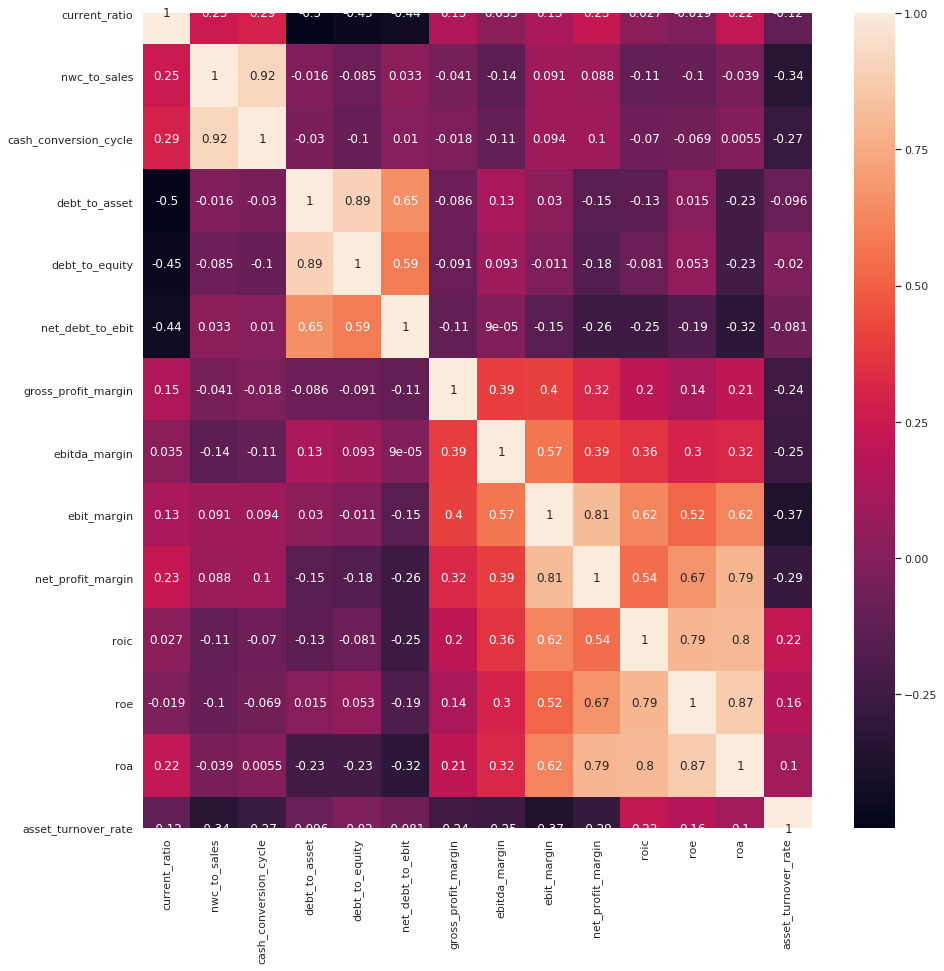

In [0]:
corr_df = ratio_data.corr(method='pearson')
plt.figure(figsize=(15,15))
sns.heatmap(corr_df, annot=True)

### Histograms and Boxplots of Ratios 

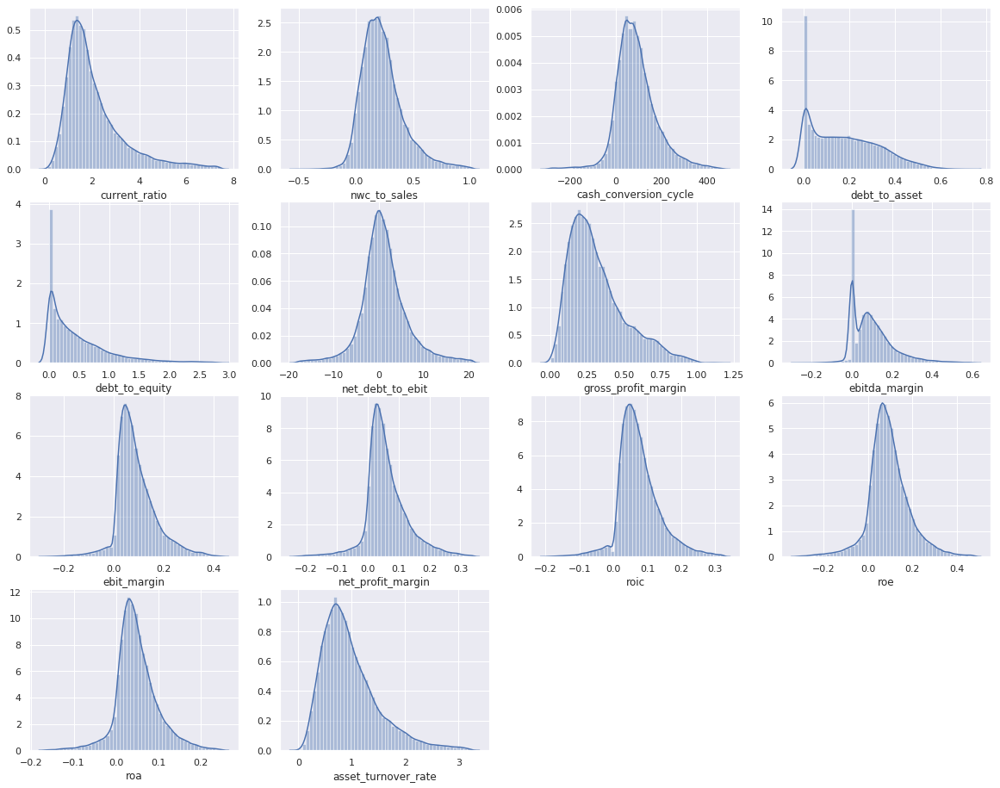

In [0]:
i = 1
fig = plt.figure(figsize=(20,20))
for column in ratio_data.columns[-14:]:
  plt.subplot(5, 4, i)
  sns.distplot(ratio_data[column])
  i += 1

plt.show()

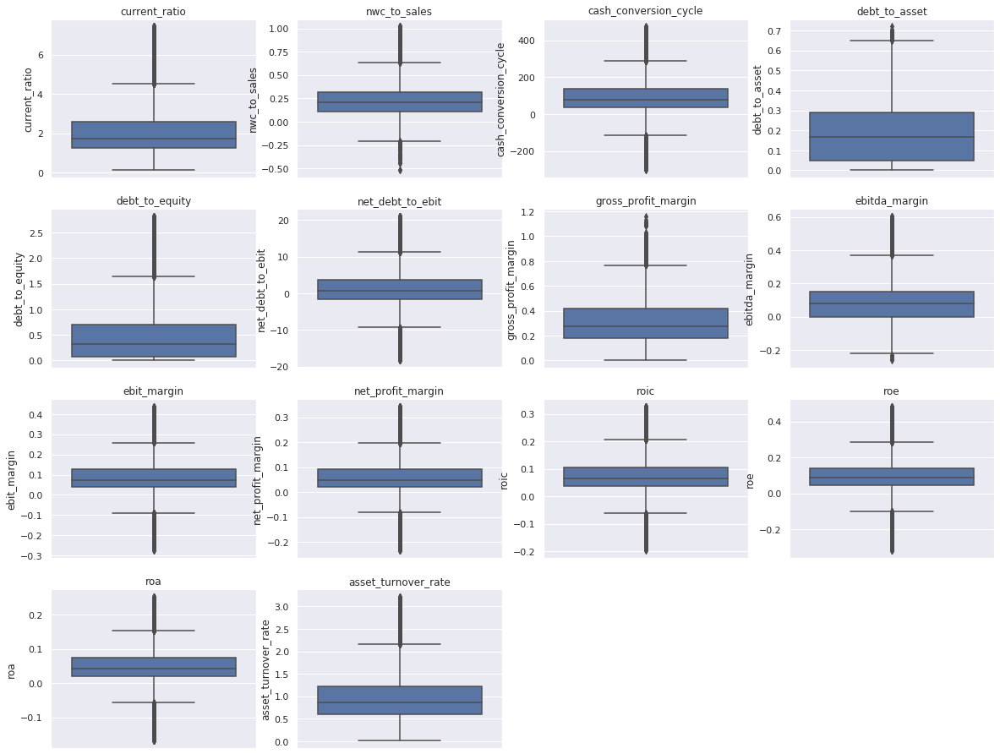

In [0]:
i = 1
fig = plt.figure(figsize=(20,20))
for column in ratio_data.columns[-14:]:
  plt.subplot(5, 4, i)
  plt.title(column)
  sns.boxplot(ratio_data[column], orient='v')
  i += 1

plt.show()

### Joint Plots of Ratios

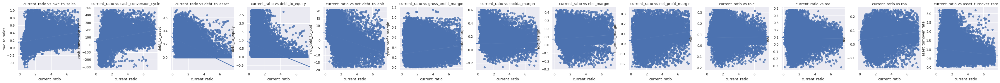

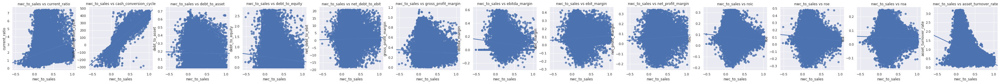

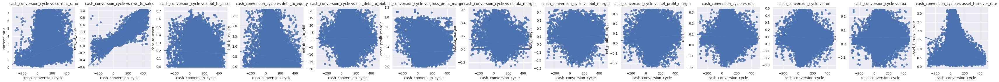

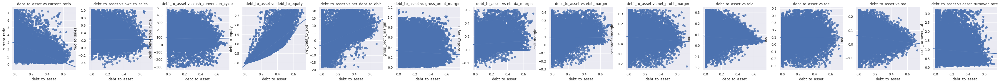

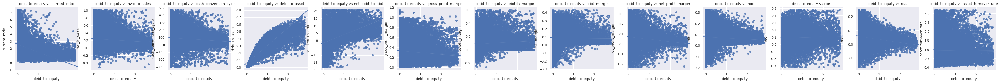

...

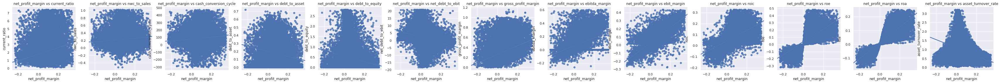

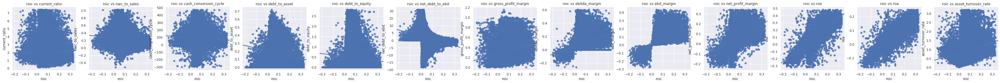

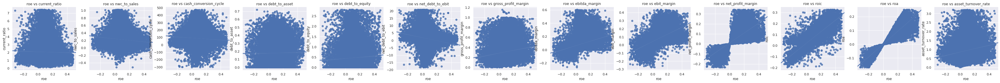

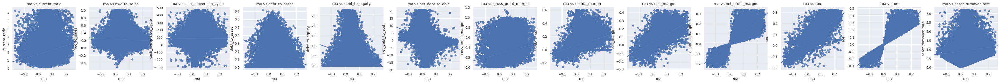

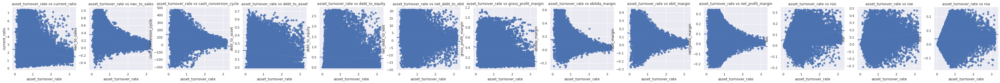

In [0]:
#fig = plt.figure(figsize=(60,4))
for column1 in ratio_data.columns[-14:]:
  i = 1
  fig = plt.figure(figsize=(60,4))
  for column2 in ratio_data.columns[-14:]:
    if column1 != column2:
      plt.subplot(1, 13, i)
      plt.title(column1 +' vs ' + column2)
      #sns.jointplot(column1, column2, data=ratio_data, kind="reg")
      sns.regplot(x=ratio_data[column1], y=ratio_data[column2])
      i += 1
  plt.show()


###Boxplots by Industries

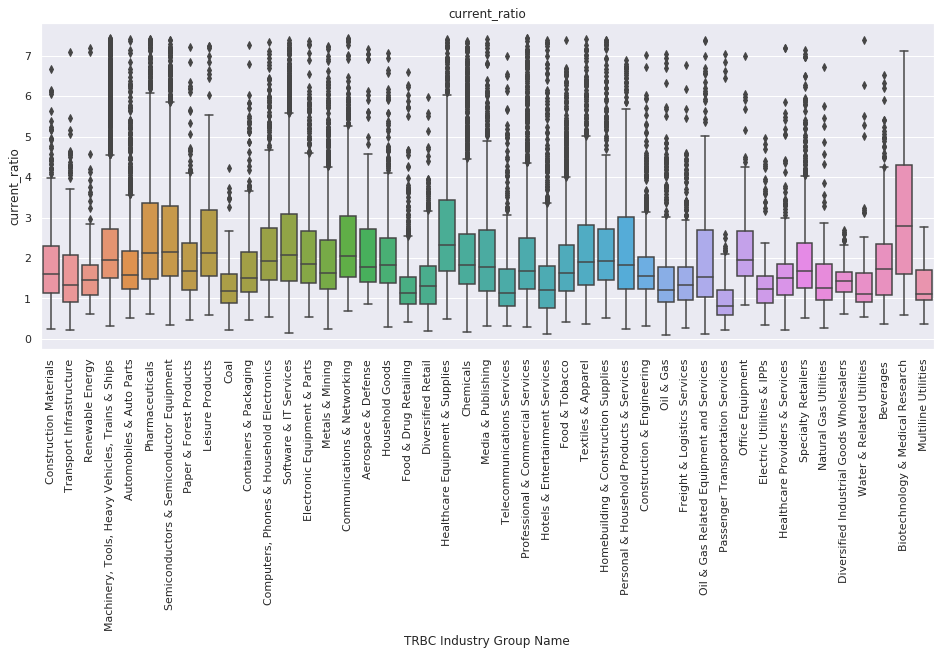

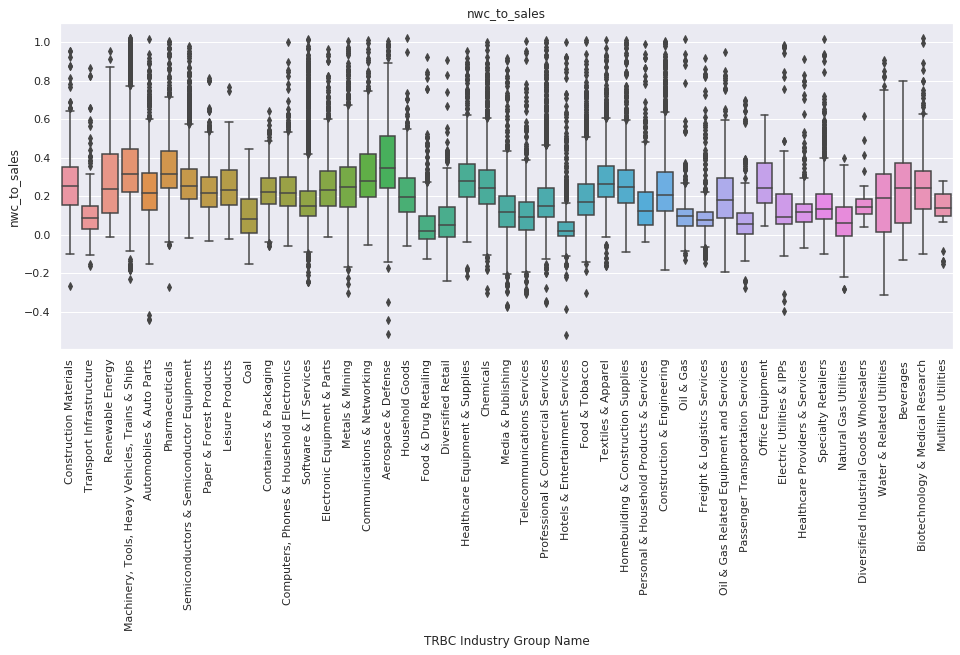

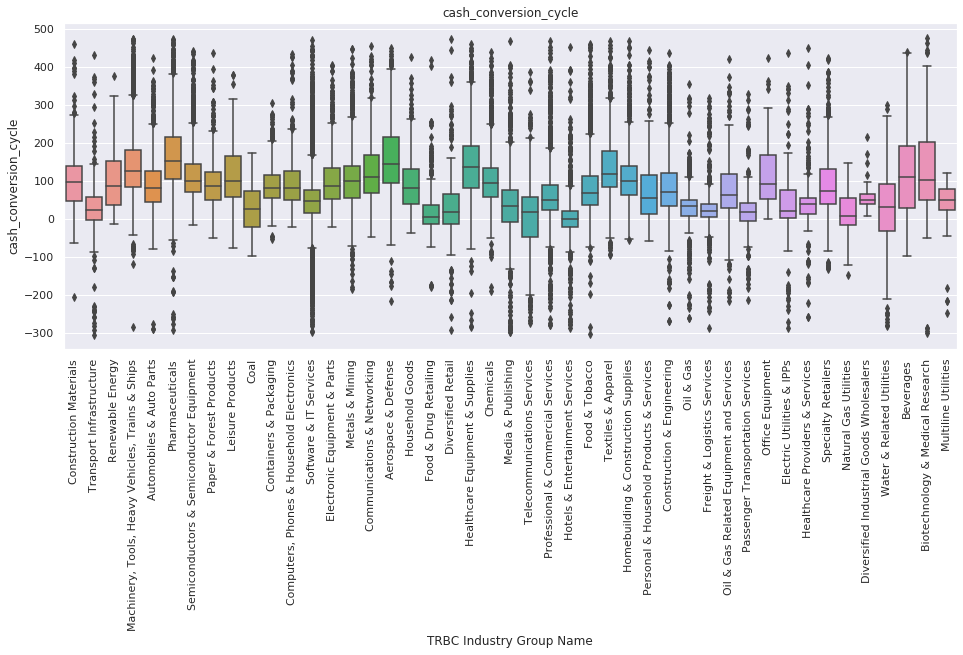

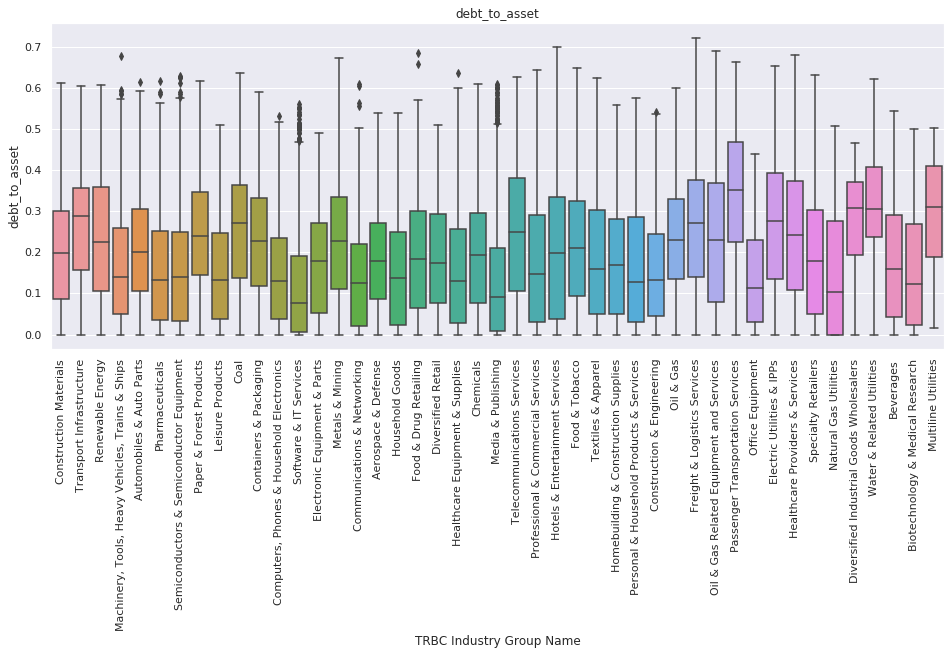

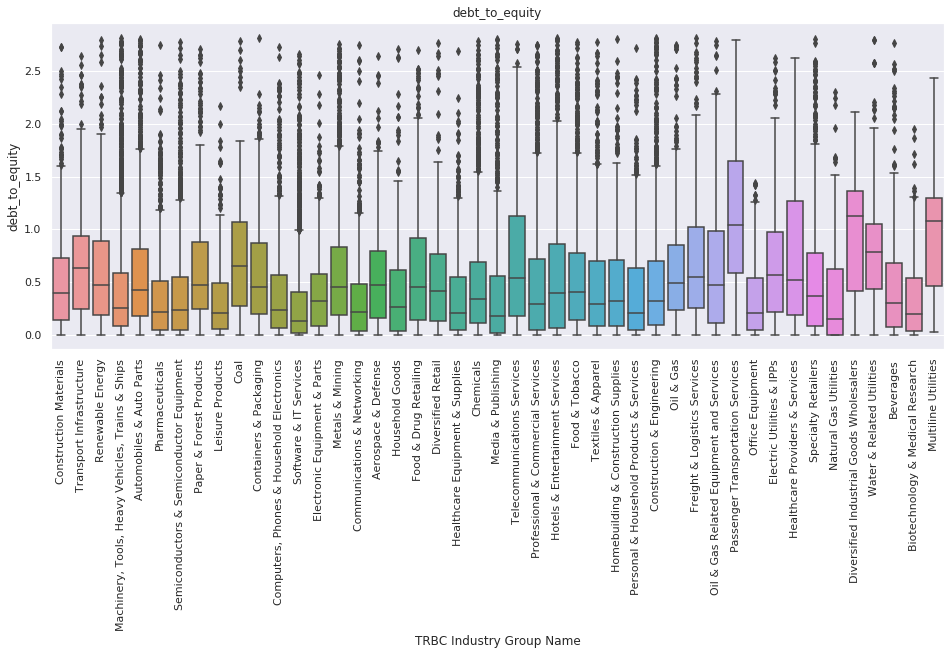

...

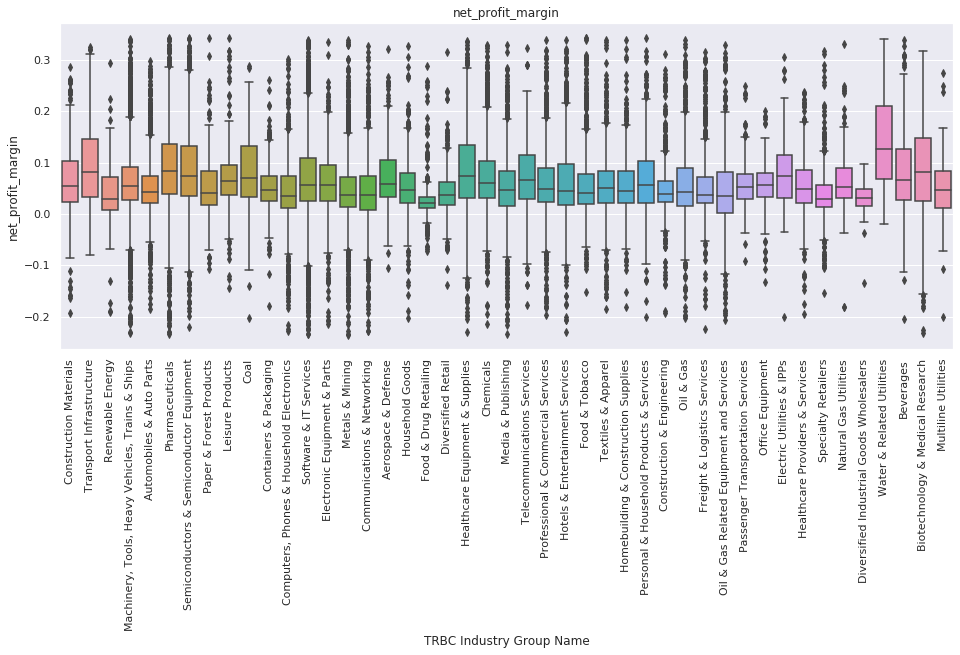

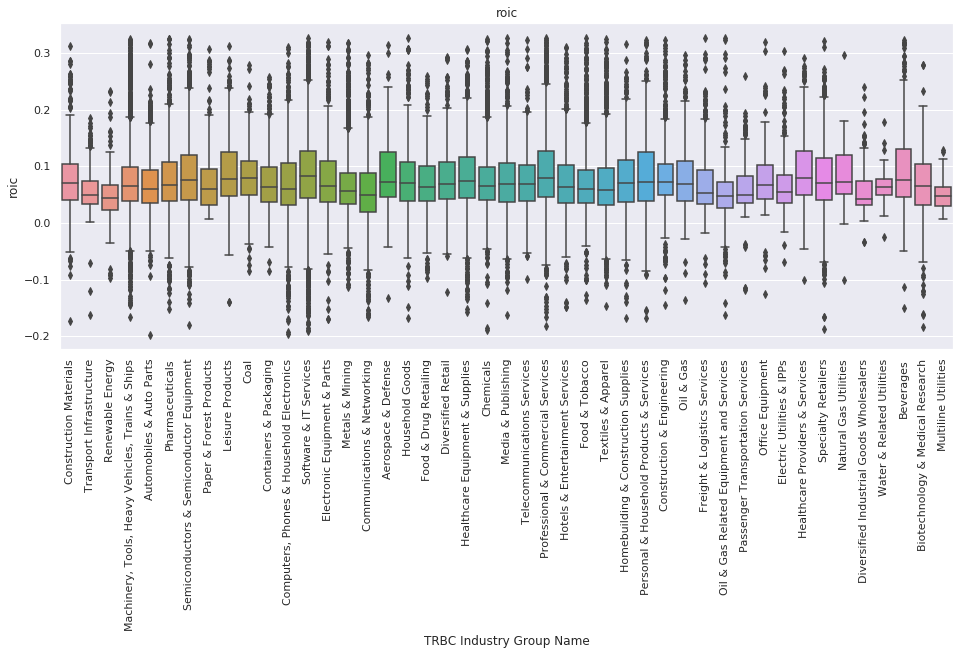

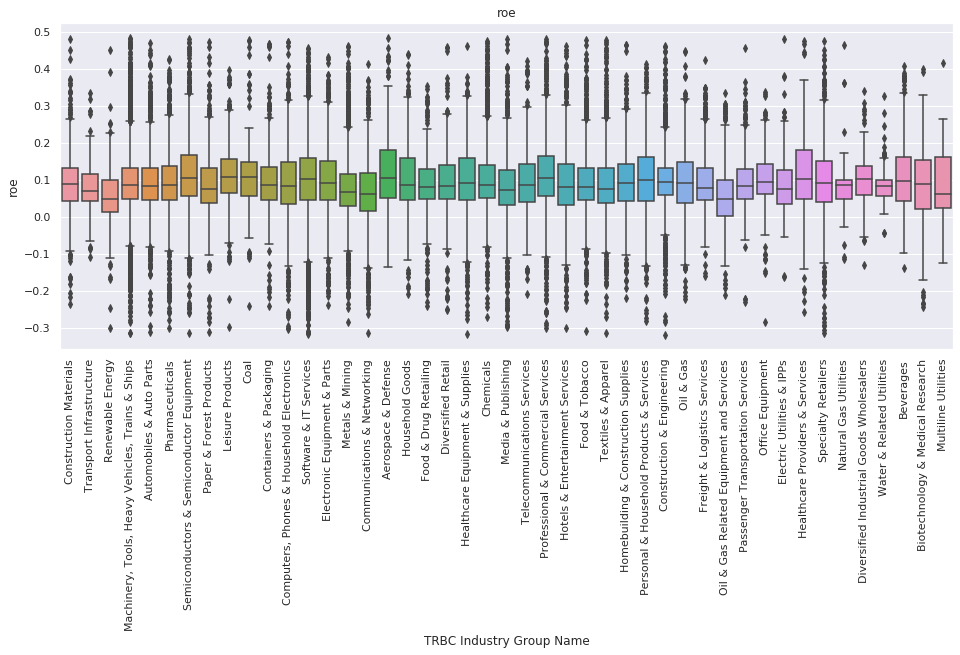

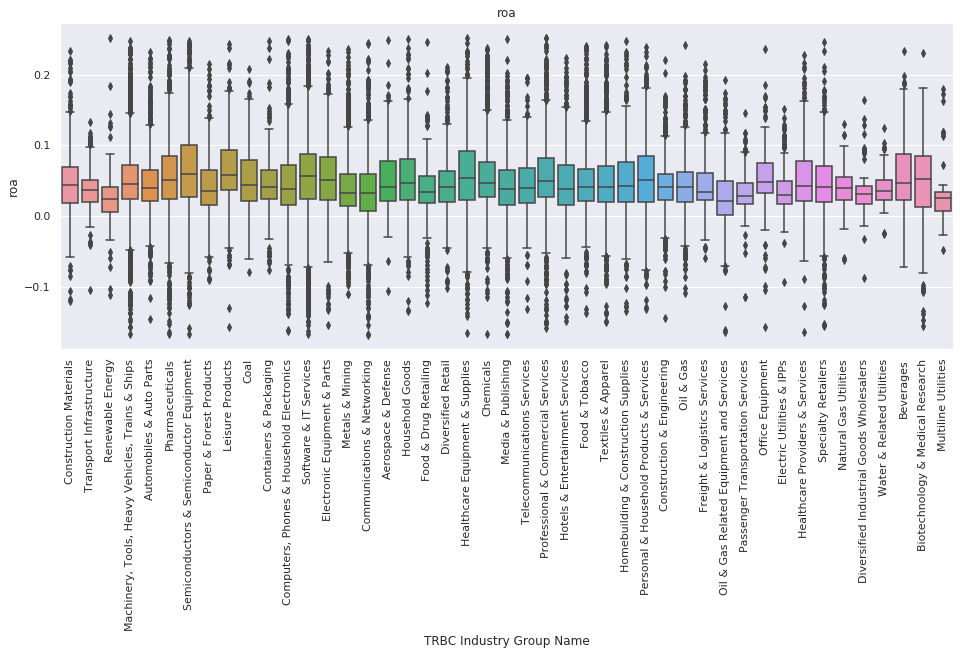

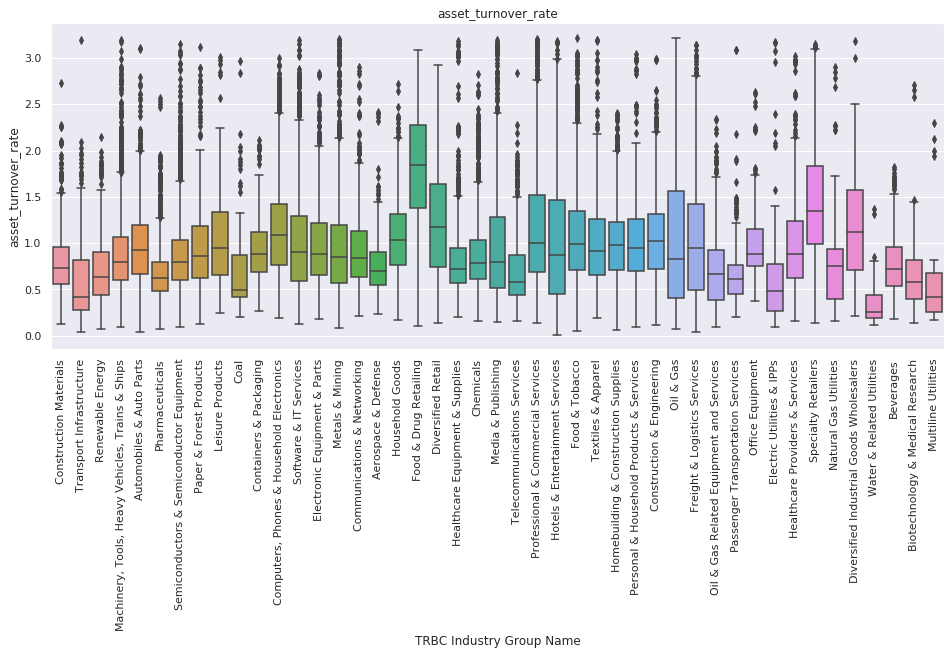

In [0]:
i = 1
for column in ratio_data.columns[-14:]:
  fig = plt.figure(figsize=(16,6))
  plt.title(column)
  sns.boxplot(x=ratio_data['TRBC Industry Group Name'] , y=ratio_data[column], orient='v')
  plt.xticks(rotation='vertical')
  plt.show()
  i += 1

### Boxplots by Country

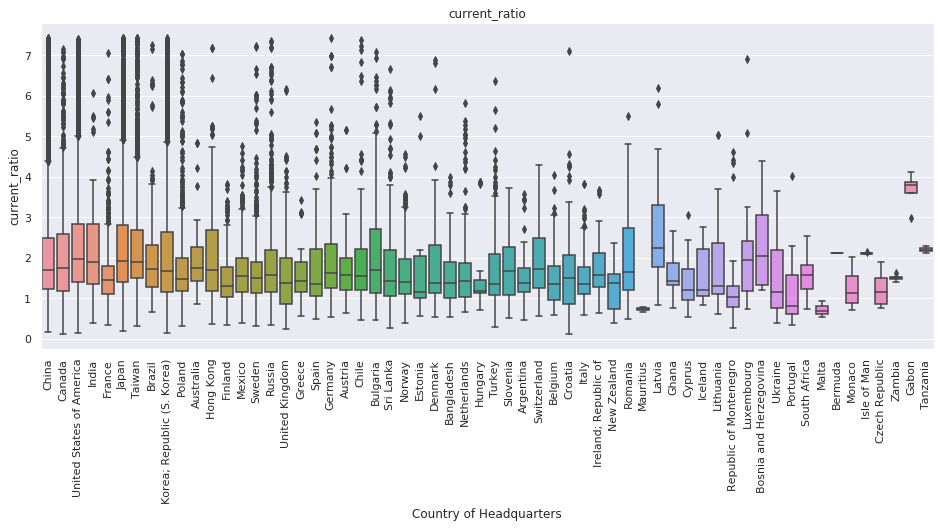

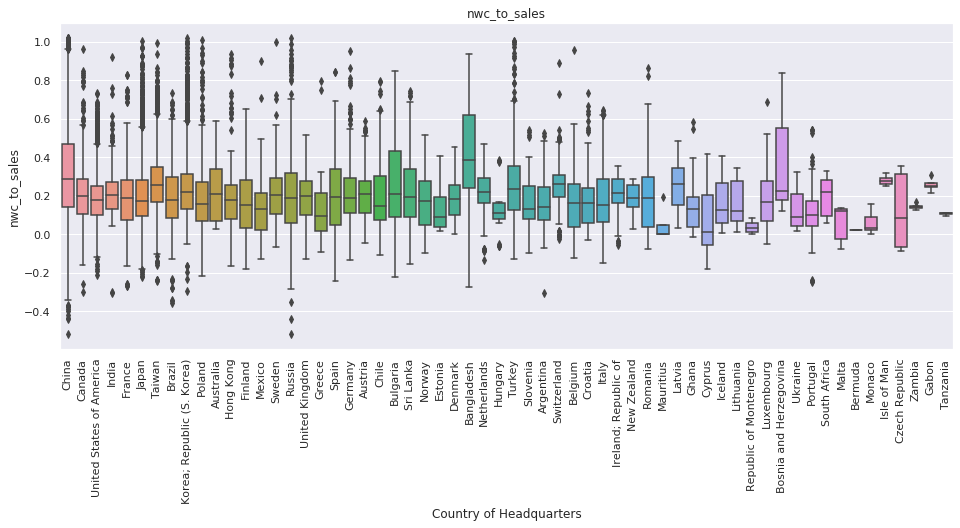

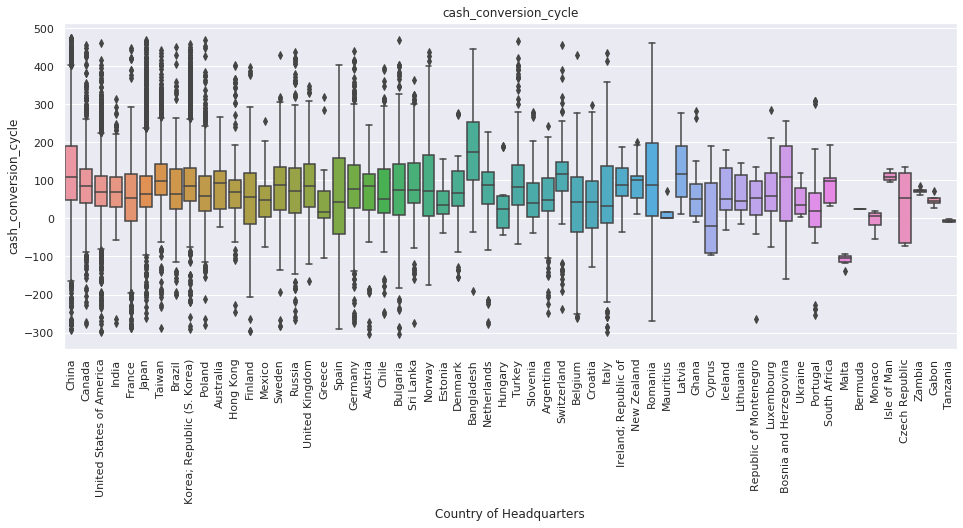

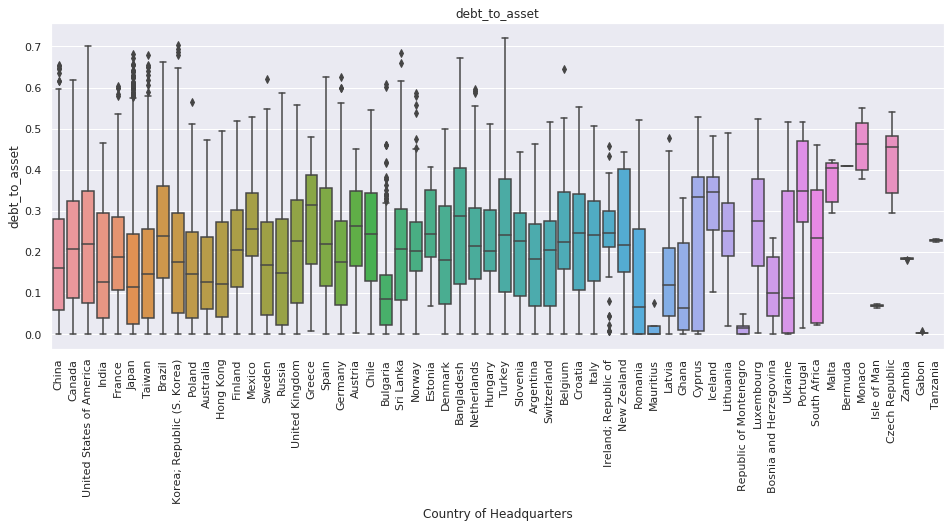

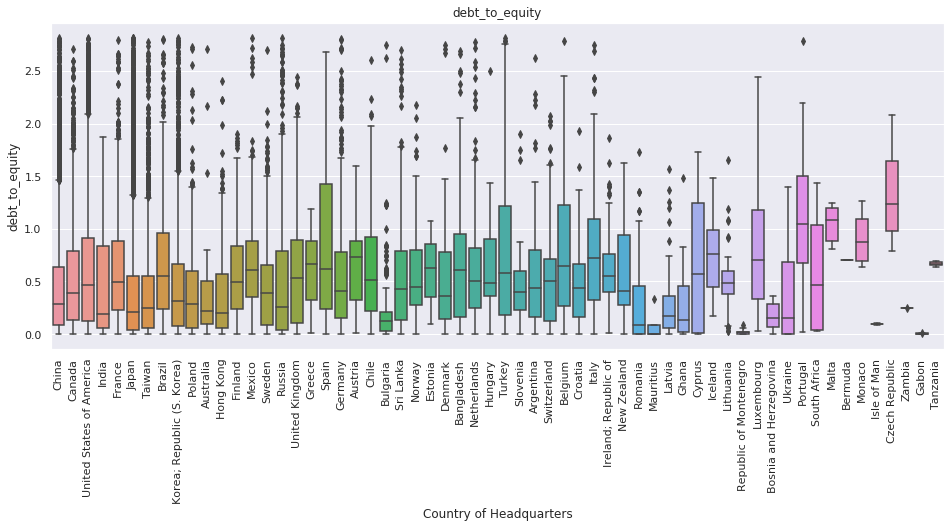

...

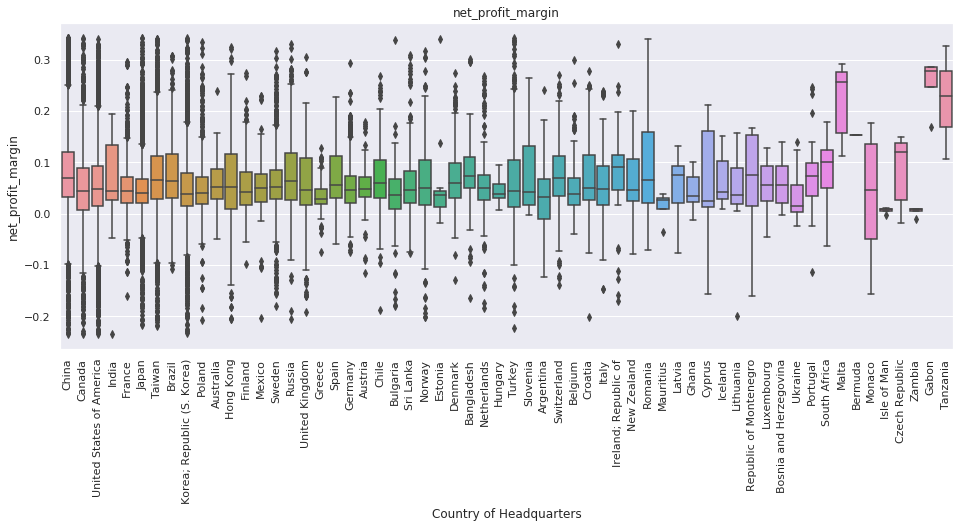

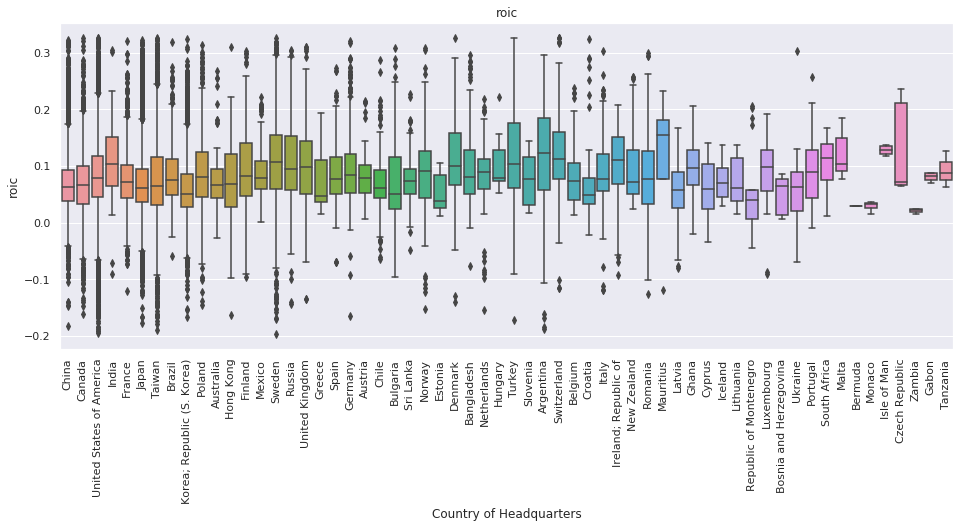

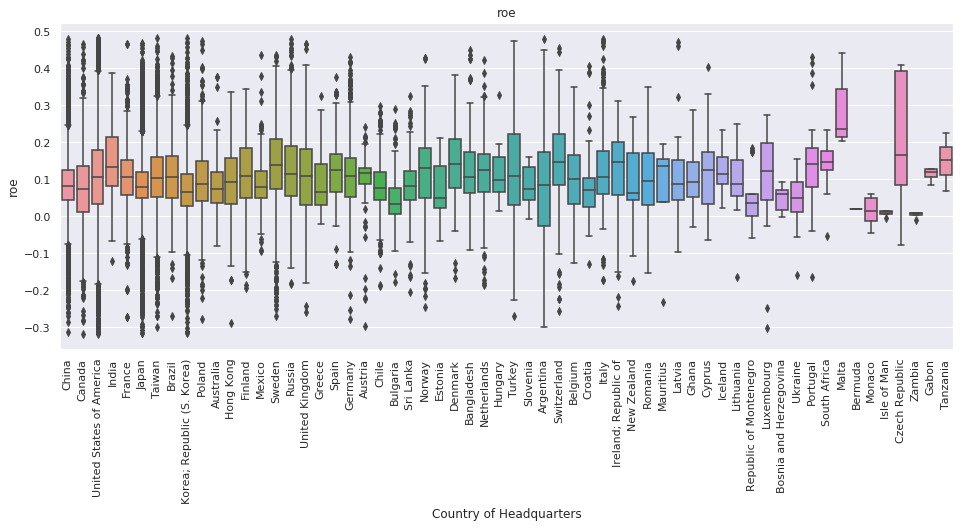

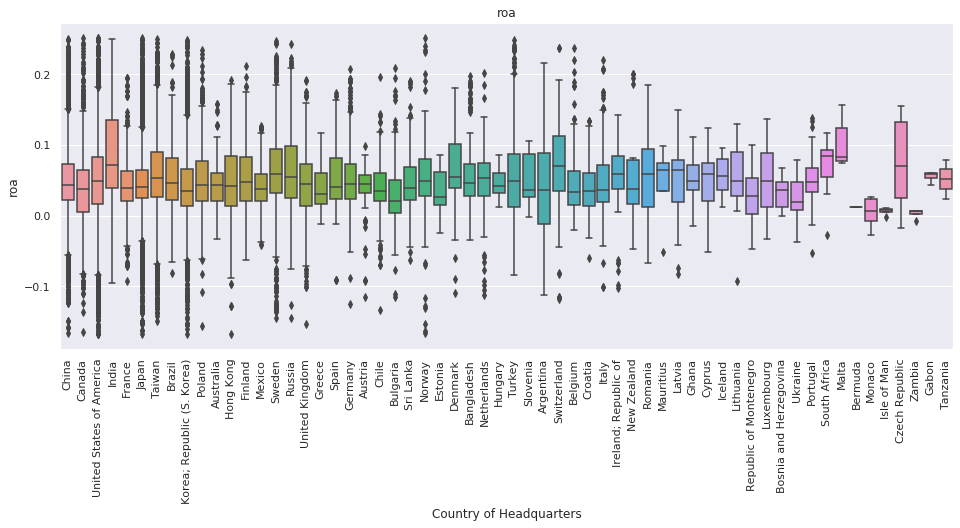

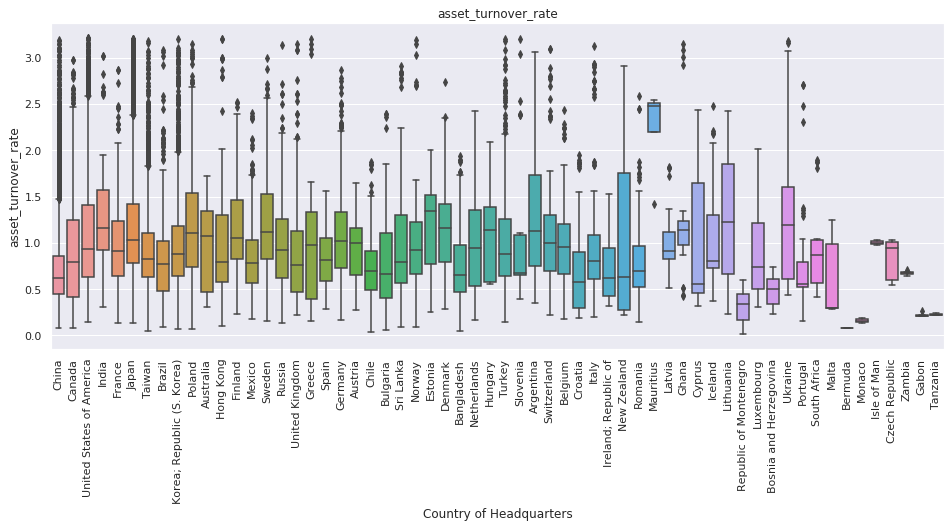

In [0]:
i = 1
for column in ratio_data.columns[-14:]:
  fig = plt.figure(figsize=(16,6))
  plt.title(column)
  sns.boxplot(x=ratio_data['Country of Headquarters'] , y=ratio_data[column], orient='v')
  plt.xticks(rotation='vertical')
  plt.show()
  i += 1

In [0]:
#Saving ratio dataframe
ratio_data2.to_csv('.../ratios_iqr_similar.csv')